# Домашнее задание

# 1 - Уменьшение палитры изображения (суммарно 6 баллов)
Для <a href='https://thumbs.dreamstime.com/x/two-lorikeet-birds-2293918.jpg'> картинки </a> нужно уменьшить число цветов в палитре.

Для этого нужно выделить **кластеры в пространстве RGB**, объекты соответствуют пикселям изображения. После выделения кластеров, все пиксели, отнесенные в один кластер, заполняются одним цветом; этот цвет может быть центроидом соответствующего кластера, медианным цветом по кластеру.

Попробуйте различные алгоритмы кластеризации:

* KMeans
* DBSCAN
* AgglomerativeClustering

Рассмотрите число кластеров K = 2, 3, 10, 20 (в алгоритмах, где есть такой гиперпараметр).

Для различных кластеризаций оцените и сравните потери от уменьшения цветов при помощи метрики 
<a href='http://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.compare_ssim'> SSIM </a>. Какой способ оказался лучшим?

Задание оценивает в 5 баллов.

Еще 1 балл даётся за запуск алгоритма на выбранных вами картинках - на них результат должен получиться красивым.

Вот вам вспомогательные функции для считывания и вывода изображений:

In [139]:
import matplotlib.pyplot as plt
import cv2 # нужно поставить себе cv2 через conda install opencv
import numpy as np

def draw_picture(image, bgr=False):
    b, g, r = cv2.split(image) # по умолчанию cv2 почему-то отдает цвета в порядке BGR вместо RGB
    new_image = cv2.merge([r, g, b])
    plt.figure(figsize=(7, 5))
    plt.axis('off')
    plt.imshow(new_image)
    plt.show()

img - это обычный трехмерный массив цветов пикселей, где две первые координаты - это координаты каждого пикселя, и третья обозначает R, G или B.

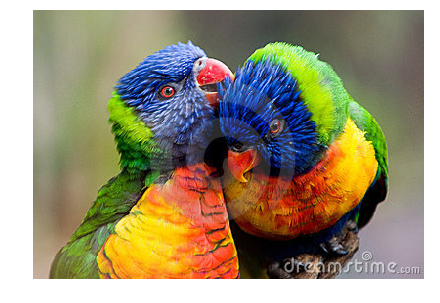

In [140]:
img = cv2.imread('birds.jpg') # считать картинку
draw_picture(img) # нарисовать картинку

In [141]:
img.shape

(275, 400, 3)

In [142]:
import warnings
warnings.filterwarnings('ignore')

In [152]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering

cluster_size_data = [2, 3, 10, 20]

In [162]:
from collections import Counter

def create_new_image(img, model) :
    X = img.reshape(img.shape[0]*img.shape[1], 3)
    y_pred = model.fit_predict(X)
    
    n_clusters = len(Counter(y_pred))
    colors = np.zeros((n_clusters, 3)) #BGR
    for cl in range(n_clusters) :
        for i in range(3) :
            colors[cl, i] = np.mean(X[y_pred == cl, i])

    X_new = np.zeros((len(X), 3))
    for i in range(len(X_new)) :
        cluster = y_pred[i]
        B = colors[cluster, 0]
        G = colors[cluster, 1]
        R = colors[cluster, 2]
        X_new[i] = np.array([B, G, R])
        
    X_new_int = X_new.astype(int)
    new_img = X_new_int.reshape(img.shape[0], img.shape[1], 3)
    return new_img

In [155]:
def draw_pictures(images, label=None):
    plt.figure(figsize=(15, 10))
    img_count = len(images)
    
    for i in range(img_count) :
        image = images[i]
        b, g, r = cv2.split(image)
        new_image = cv2.merge([r, g, b])
        plt.subplot(220 + i + 1)
        plt.axis('off')
        plt.imshow(new_image)
        if (img_count == 2) & (i == 1) :
            plt.title(label)
        else :
            plt.title(str(i + 1))
    
    plt.show()

In [156]:
from skimage.measure import compare_ssim as ssim

def show_ssim(img, new_img, label='new img') :
    draw_pictures([img, new_img], label);
    print('SSIM(original image, {}) = {}'.format(label, ssim(img, new_img, multichannel=True)))

In [158]:
KMeans_images = np.array([None, None, None, None])

for i in range(4) :
    n_clusters = cluster_size_data[i]
    KMeans_images[i] = create_new_image(img, KMeans(n_clusters=n_clusters))

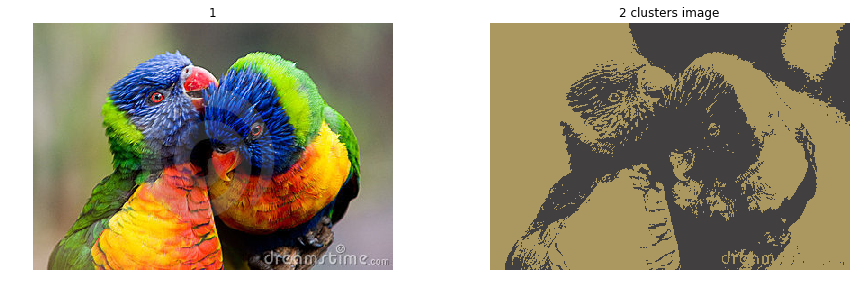

SSIM(original image, 2 clusters image) = 0.5333879051927238


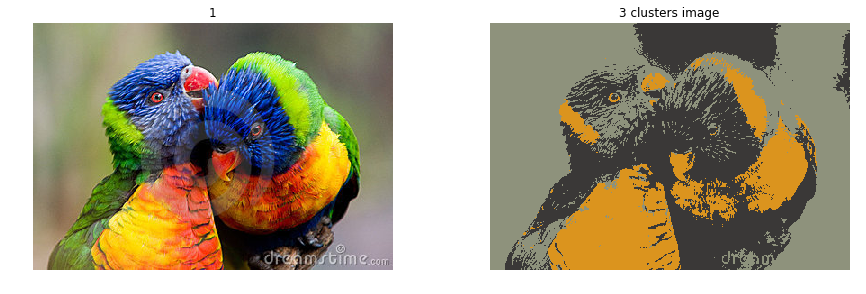

SSIM(original image, 3 clusters image) = 0.5634788073873914


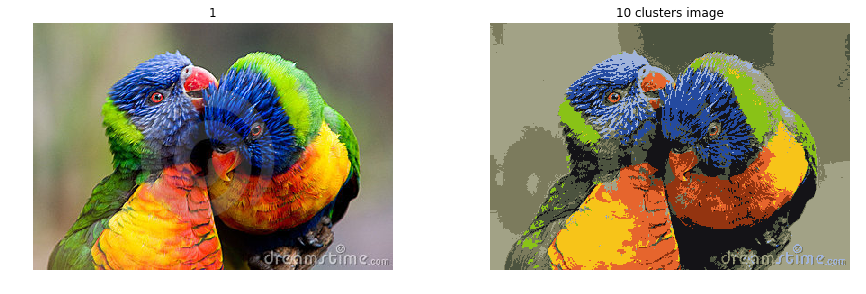

SSIM(original image, 10 clusters image) = 0.6784521226096082


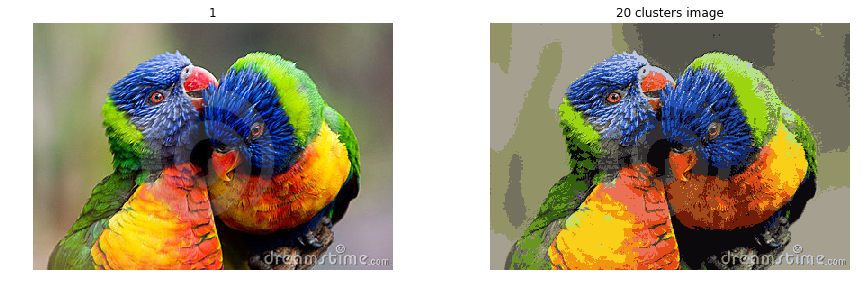

SSIM(original image, 20 clusters image) = 0.7591335655627779


In [159]:
for i in range(len(KMeans_images)) :
    show_ssim(img, KMeans_images[i], str(cluster_size_data[i]) + ' clusters image')

In [149]:
beach_img = cv2.imread('beach_small.jpg')

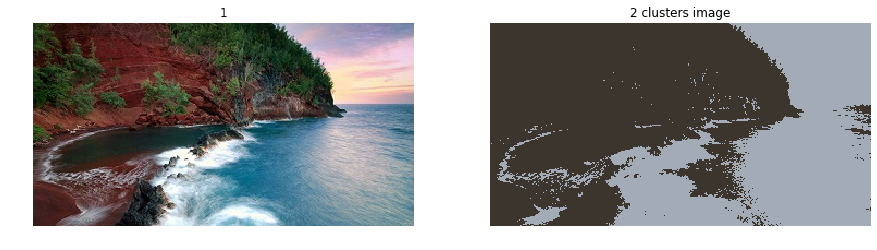

SSIM(original image, 2 clusters image) = 0.39273134929110015


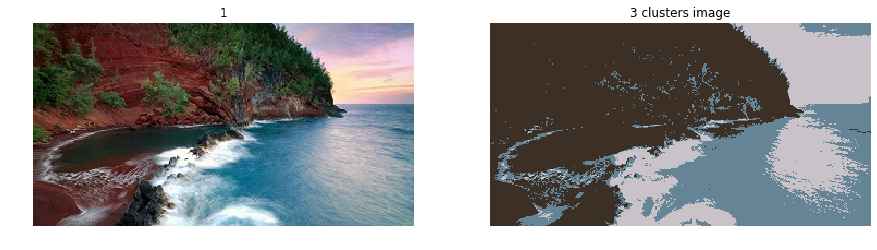

SSIM(original image, 3 clusters image) = 0.48203297066571826


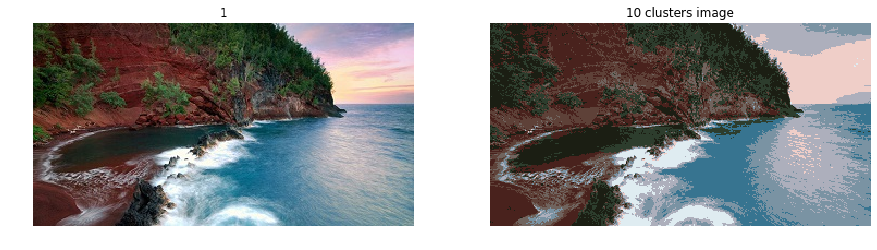

SSIM(original image, 10 clusters image) = 0.754580947016863


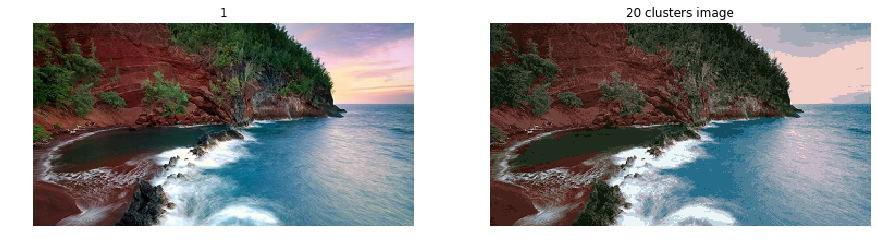

SSIM(original image, 20 clusters image) = 0.8563288096261177


In [160]:
KMeans_beach_images = np.array([None, None, None, None])

for i in range(4) :
    n_clusters = cluster_size_data[i]
    KMeans_beach_images[i] = create_new_image(beach_img, KMeans(n_clusters=n_clusters))
    
for i in range(len(KMeans_beach_images)) :
    show_ssim(beach_img, KMeans_beach_images[i], str(cluster_size_data[i]) + ' clusters image')

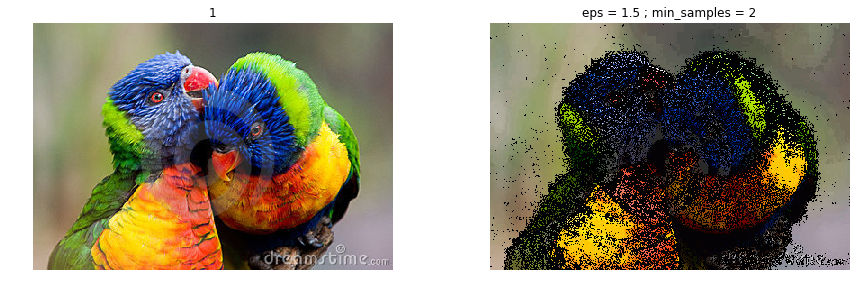

SSIM(original image, eps = 1.5 ; min_samples = 2) = 0.48084921440233835


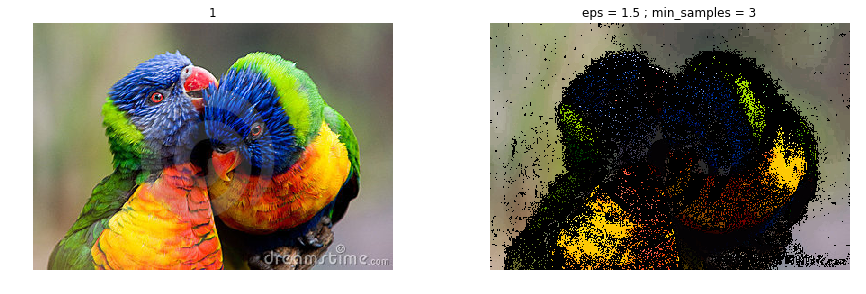

SSIM(original image, eps = 1.5 ; min_samples = 3) = 0.09292194881885162


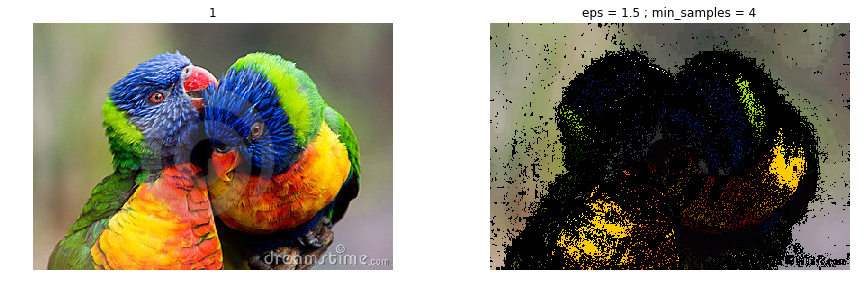

SSIM(original image, eps = 1.5 ; min_samples = 4) = 0.06851082905058198


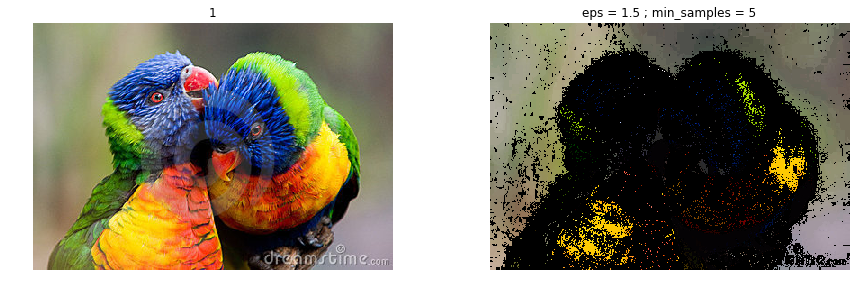

SSIM(original image, eps = 1.5 ; min_samples = 5) = -0.8485953745998618


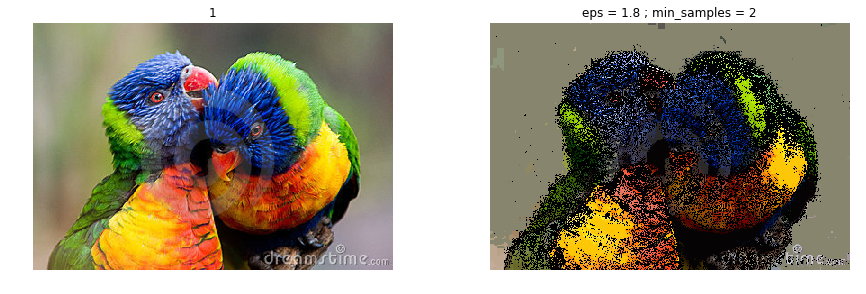

SSIM(original image, eps = 1.8 ; min_samples = 2) = 0.5678409560198446


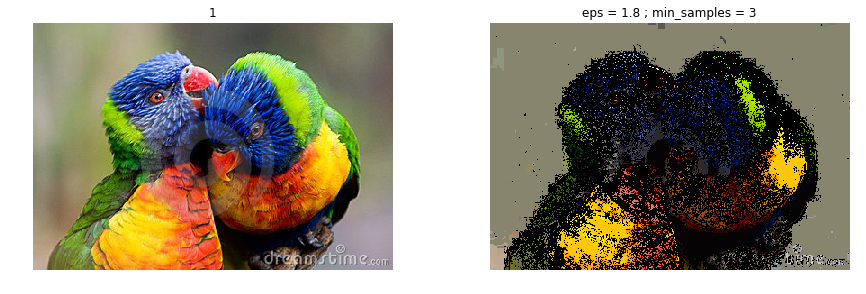

SSIM(original image, eps = 1.8 ; min_samples = 3) = 6.553011922681171


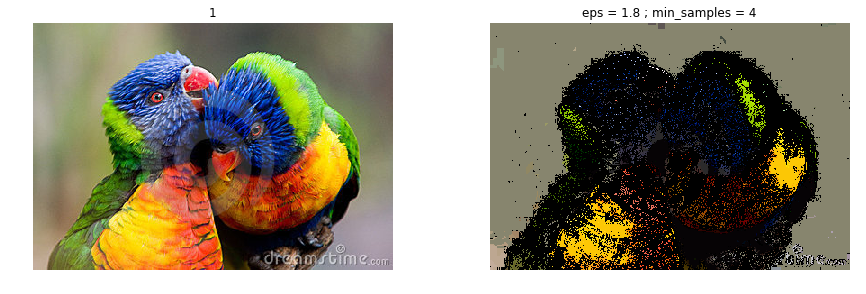

SSIM(original image, eps = 1.8 ; min_samples = 4) = 0.9205877217961409


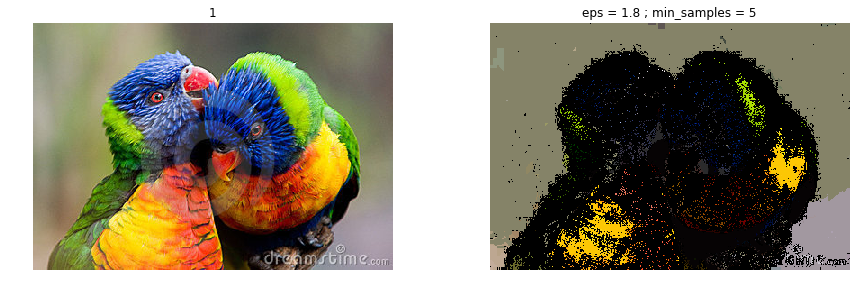

SSIM(original image, eps = 1.8 ; min_samples = 5) = -0.4931043058084658


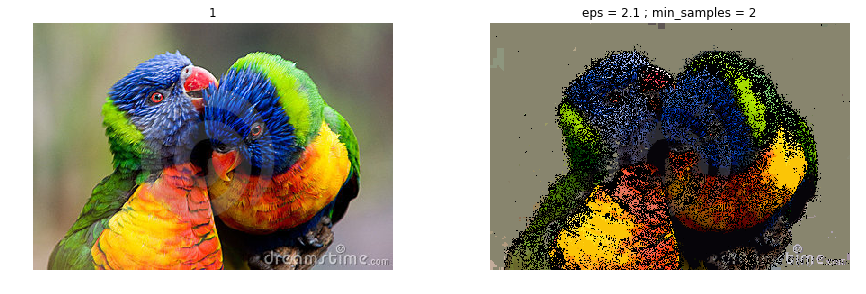

SSIM(original image, eps = 2.1 ; min_samples = 2) = -5.3432847205833225


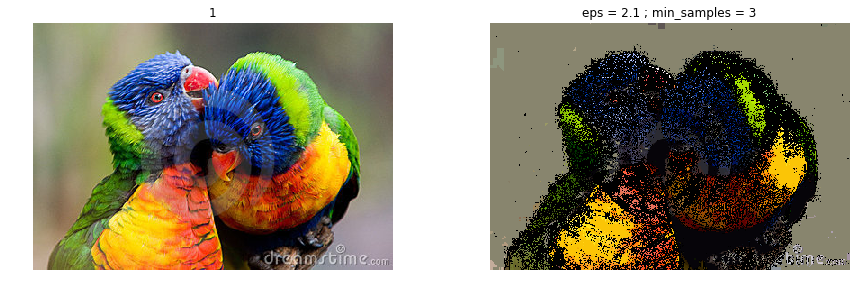

SSIM(original image, eps = 2.1 ; min_samples = 3) = -43.32354594040468


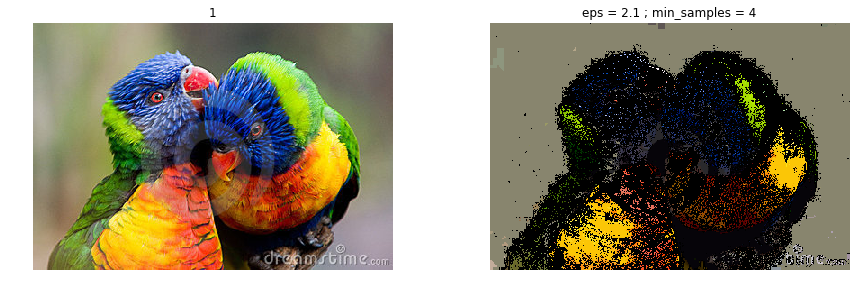

SSIM(original image, eps = 2.1 ; min_samples = 4) = -0.5165102850984934


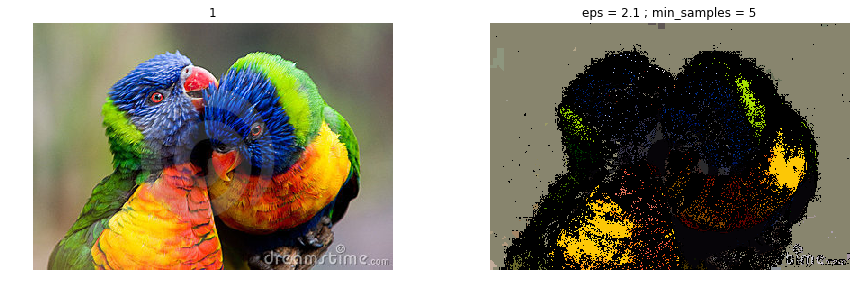

SSIM(original image, eps = 2.1 ; min_samples = 5) = 1.6436873211903735


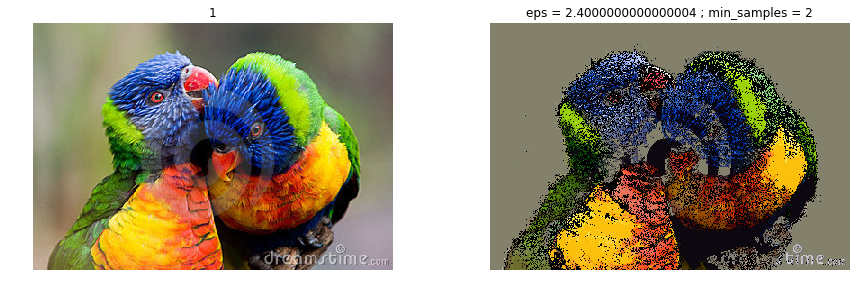

SSIM(original image, eps = 2.4000000000000004 ; min_samples = 2) = 1.4442976826972664


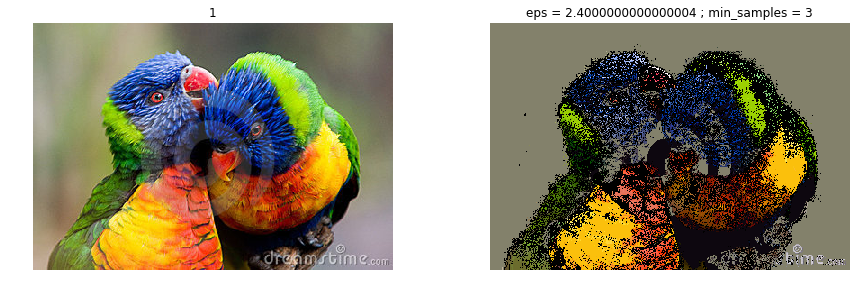

SSIM(original image, eps = 2.4000000000000004 ; min_samples = 3) = 0.17426127978081185


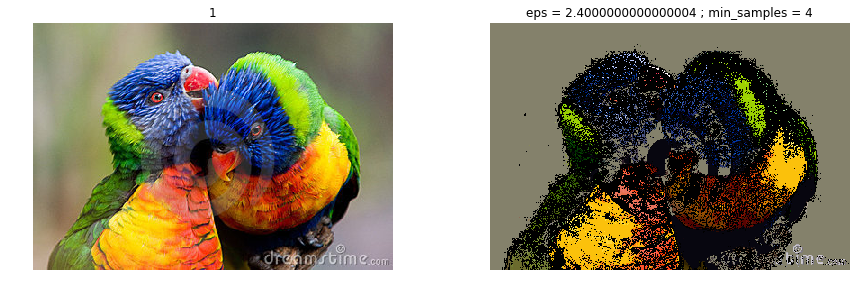

SSIM(original image, eps = 2.4000000000000004 ; min_samples = 4) = -4.294903580038169


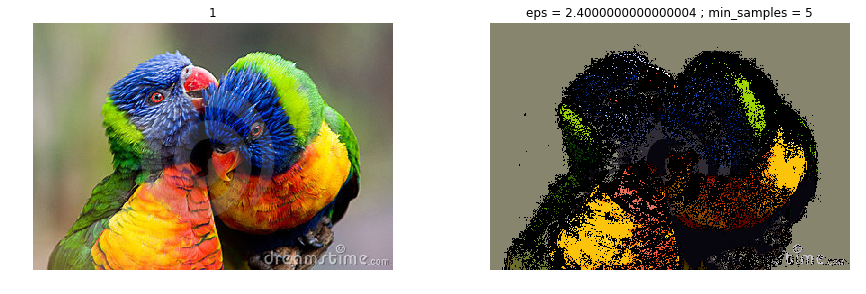

SSIM(original image, eps = 2.4000000000000004 ; min_samples = 5) = 4.098499924386859


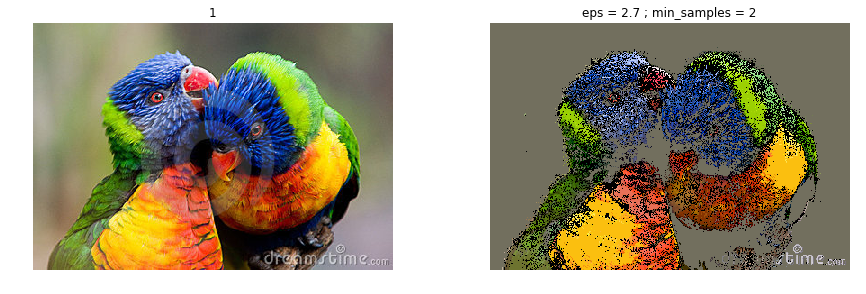

SSIM(original image, eps = 2.7 ; min_samples = 2) = 0.04345945428207413


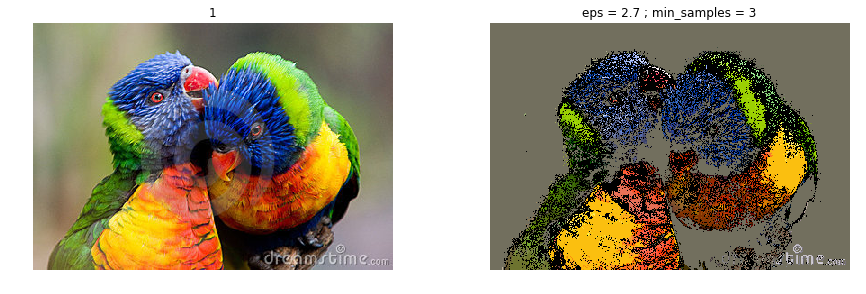

SSIM(original image, eps = 2.7 ; min_samples = 3) = -0.7304833359822488


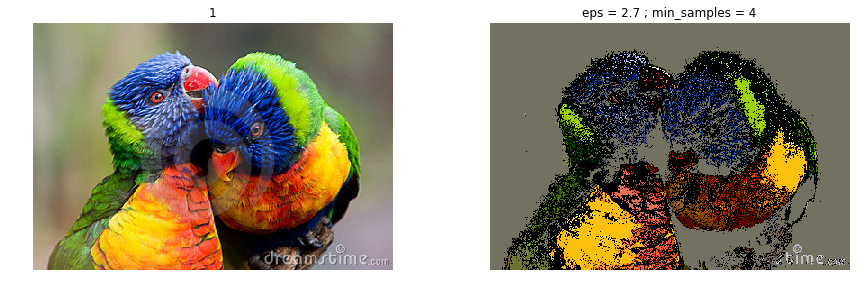

SSIM(original image, eps = 2.7 ; min_samples = 4) = 0.14875197567008522


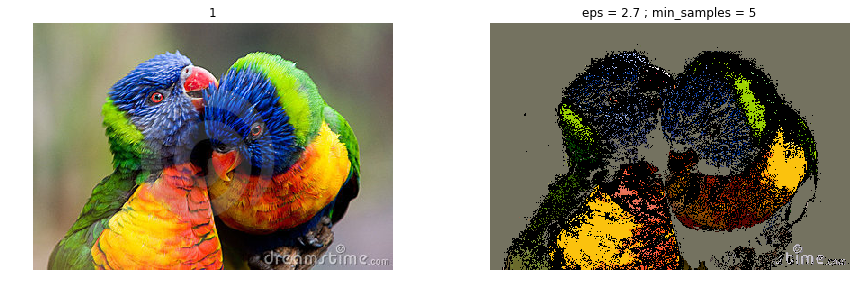

SSIM(original image, eps = 2.7 ; min_samples = 5) = -3.152811636050797


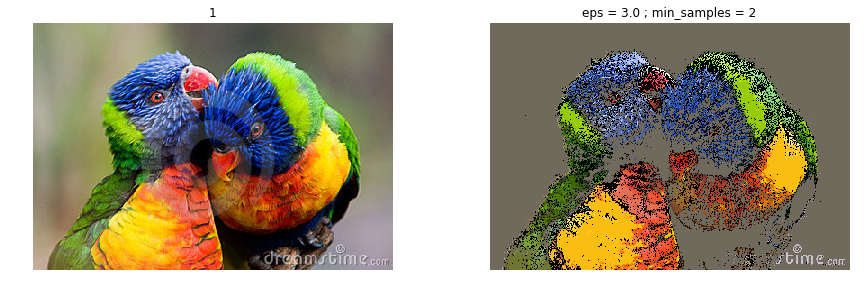

SSIM(original image, eps = 3.0 ; min_samples = 2) = 1.301752211344419


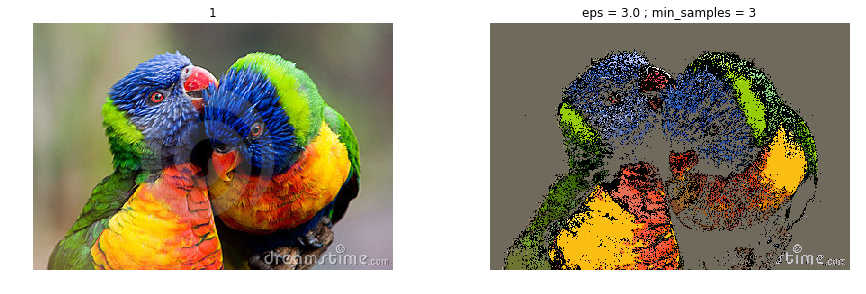

SSIM(original image, eps = 3.0 ; min_samples = 3) = -0.08044968282829193


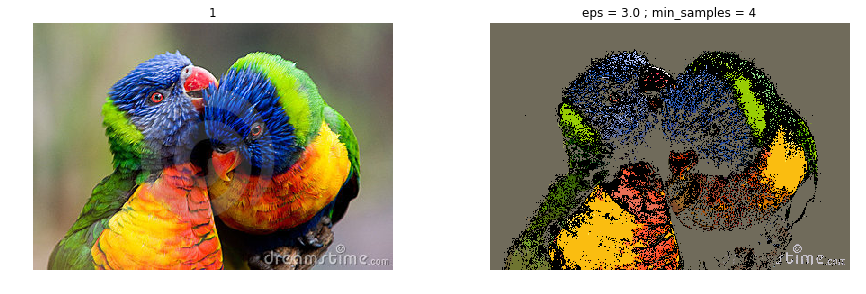

SSIM(original image, eps = 3.0 ; min_samples = 4) = 2.7646298470868356


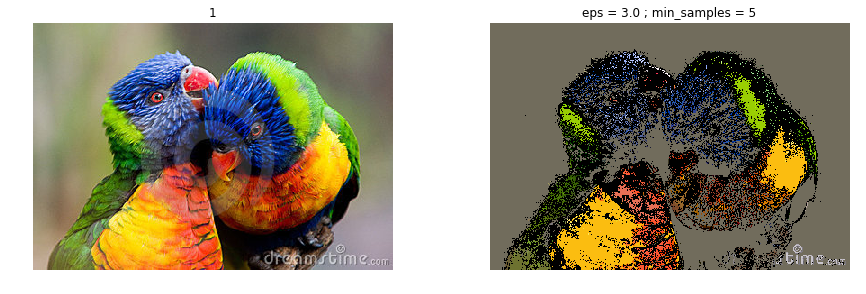

SSIM(original image, eps = 3.0 ; min_samples = 5) = -1.8890062493080653


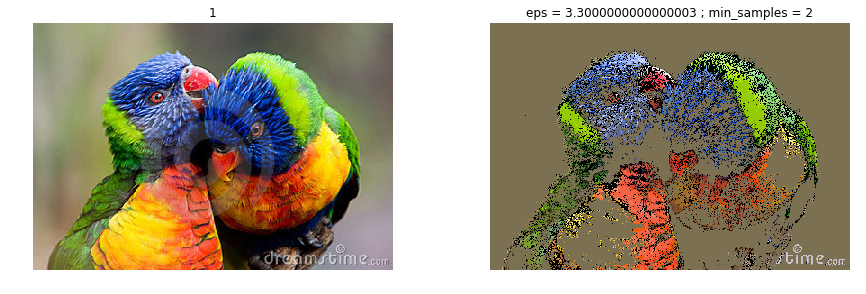

SSIM(original image, eps = 3.3000000000000003 ; min_samples = 2) = 1.0076621970775508


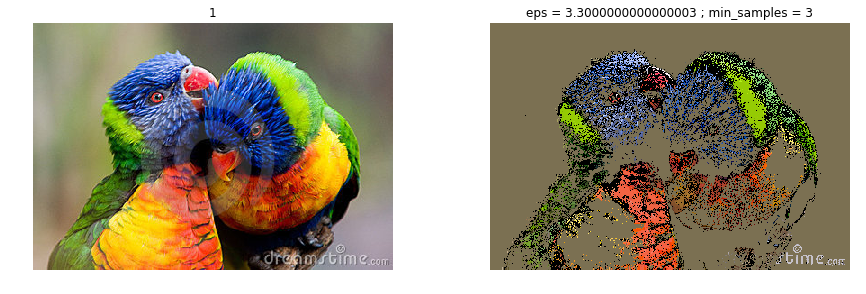

SSIM(original image, eps = 3.3000000000000003 ; min_samples = 3) = 1.3011850212239828


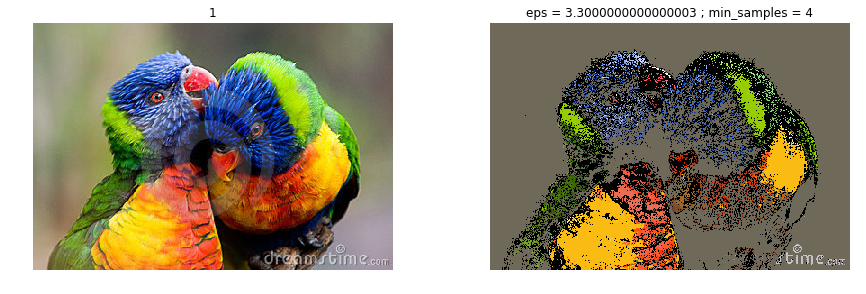

SSIM(original image, eps = 3.3000000000000003 ; min_samples = 4) = 1.695906019414366


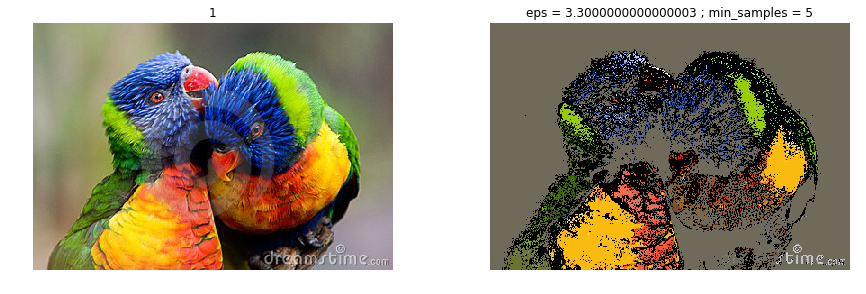

SSIM(original image, eps = 3.3000000000000003 ; min_samples = 5) = 0.46405274240232136


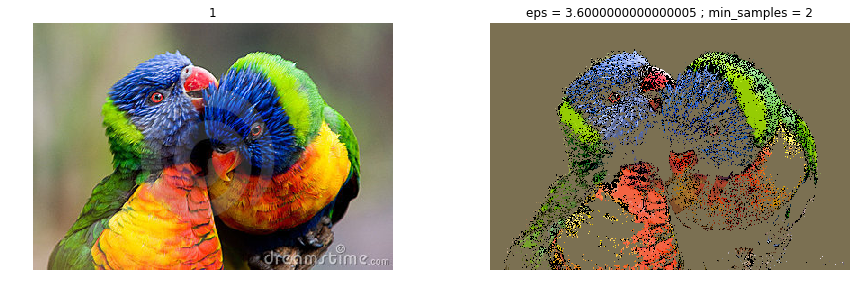

SSIM(original image, eps = 3.6000000000000005 ; min_samples = 2) = 1.2885955592351885


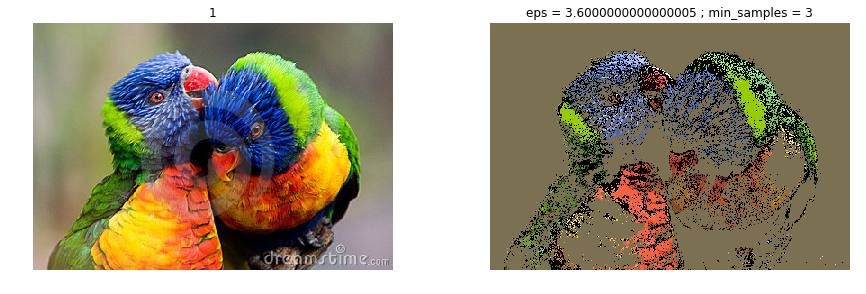

SSIM(original image, eps = 3.6000000000000005 ; min_samples = 3) = -5.216688528326519


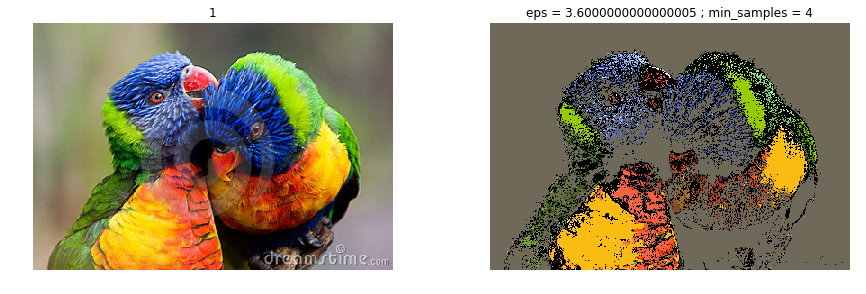

SSIM(original image, eps = 3.6000000000000005 ; min_samples = 4) = -22.29376319486615


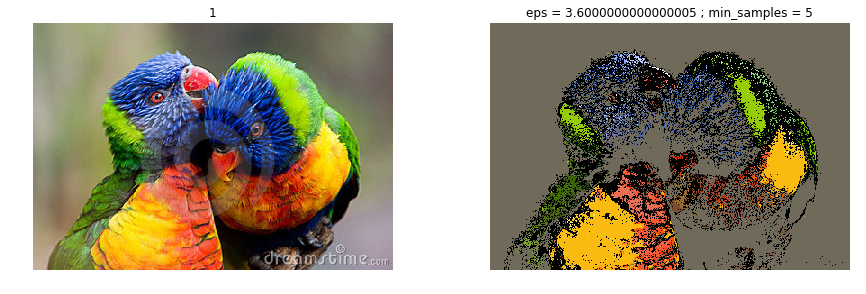

SSIM(original image, eps = 3.6000000000000005 ; min_samples = 5) = 0.5643572932071738


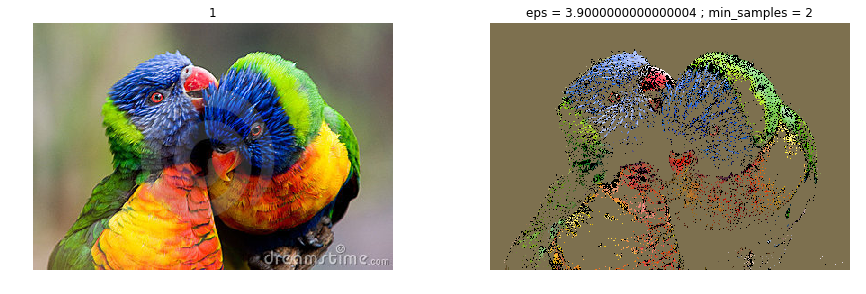

SSIM(original image, eps = 3.9000000000000004 ; min_samples = 2) = 1.5736124468241146


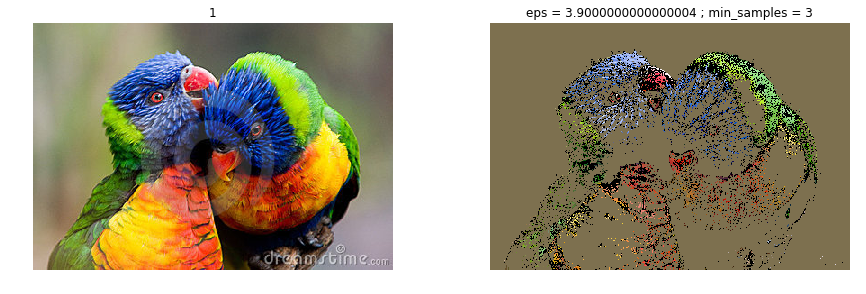

SSIM(original image, eps = 3.9000000000000004 ; min_samples = 3) = -14.924237728039808


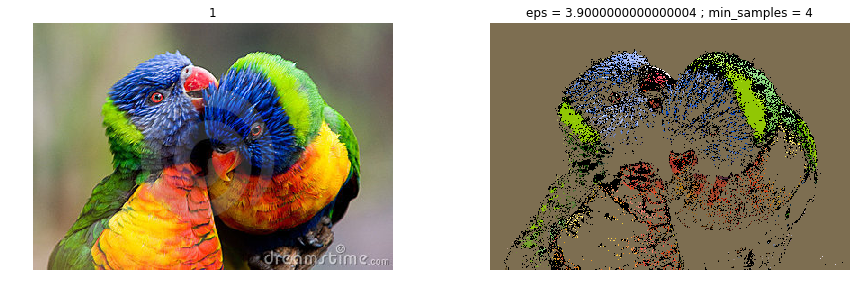

SSIM(original image, eps = 3.9000000000000004 ; min_samples = 4) = 1.9222094754707768


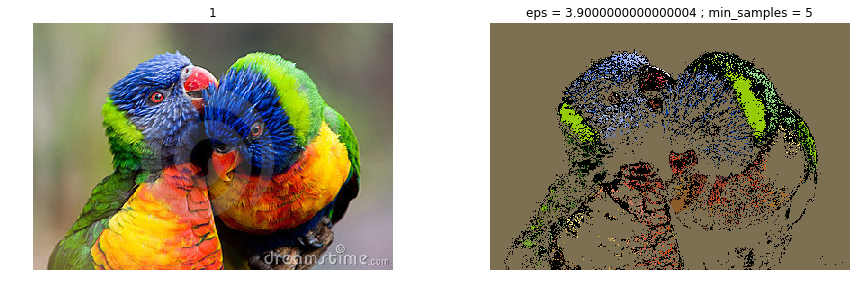

SSIM(original image, eps = 3.9000000000000004 ; min_samples = 5) = 4.320035837430706


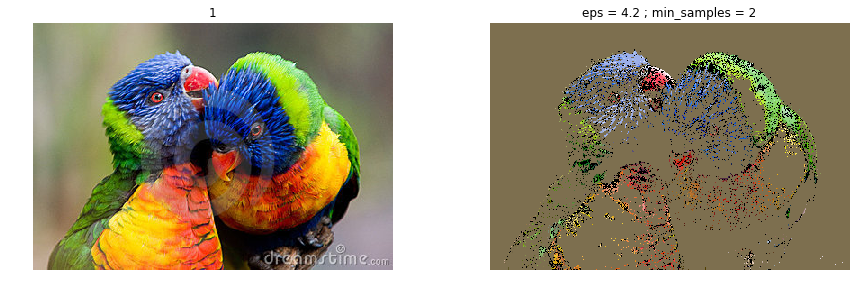

SSIM(original image, eps = 4.2 ; min_samples = 2) = -1.4424903789810848


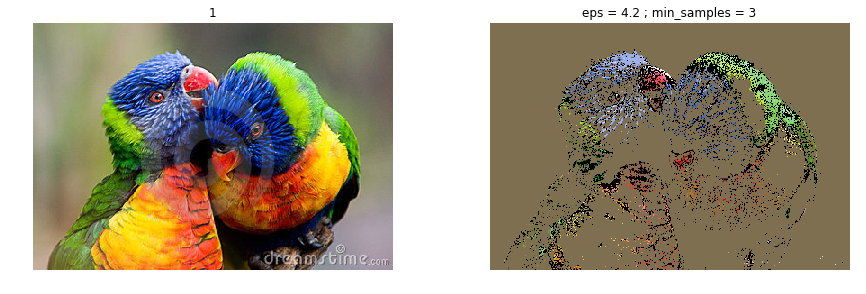

SSIM(original image, eps = 4.2 ; min_samples = 3) = 3.5362310801776844


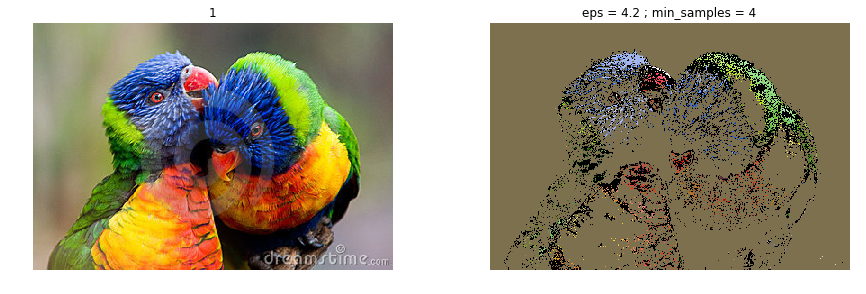

SSIM(original image, eps = 4.2 ; min_samples = 4) = 0.624151039698659


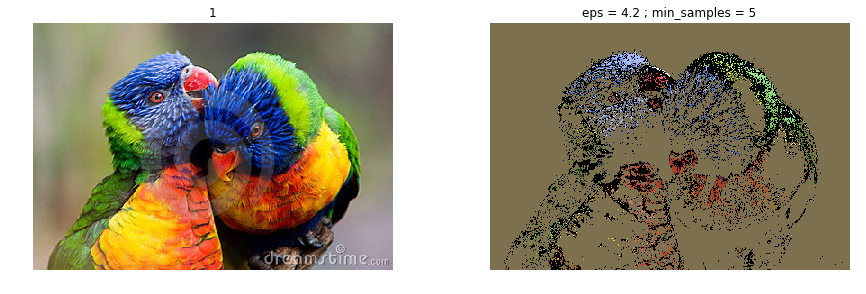

SSIM(original image, eps = 4.2 ; min_samples = 5) = 1.8562013482412258


In [166]:
epss_size_data = np.linspace(1.5, 4.2, 10)
min_samples_size_data = np.array([2, 3, 4, 5])


for i in range(len(epss_size_data)) :
    for j in range(len(min_samples_size_data)) :
        eps = epss_size_data[i]
        min_samples = min_samples_size_data[j]
        new_img = create_new_image(img, DBSCAN(eps=eps, min_samples=min_samples))
        show_ssim(img, new_img, 'eps = {} ; min_samples = {}'.format(eps, min_samples))
    
    
    


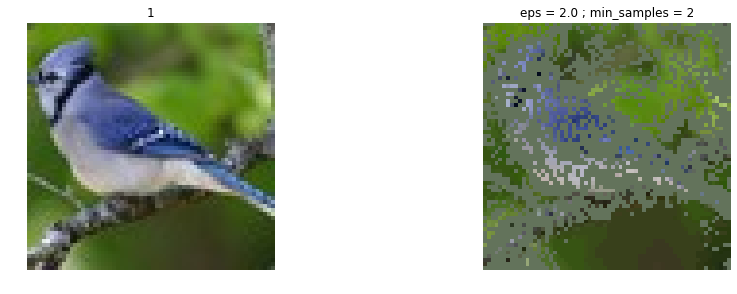

SSIM(original image, eps = 2.0 ; min_samples = 2) = 0.4114621768170575


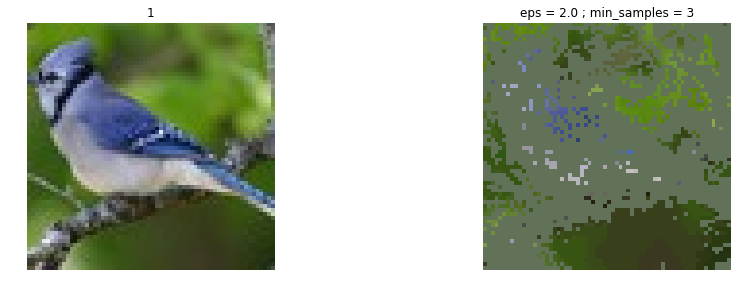

SSIM(original image, eps = 2.0 ; min_samples = 3) = 0.2930077690694291


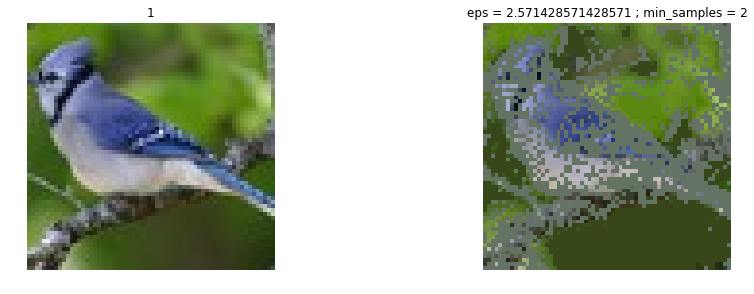

SSIM(original image, eps = 2.571428571428571 ; min_samples = 2) = 0.523633544354824


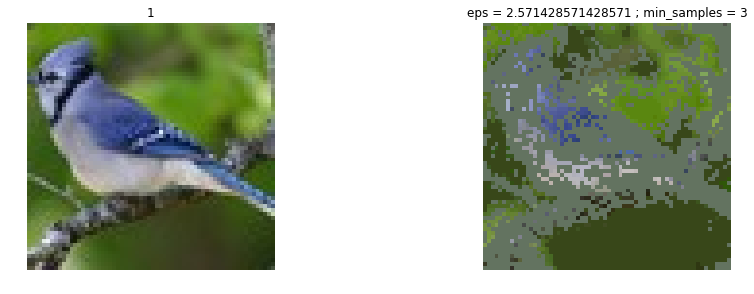

SSIM(original image, eps = 2.571428571428571 ; min_samples = 3) = 0.40787364870117776


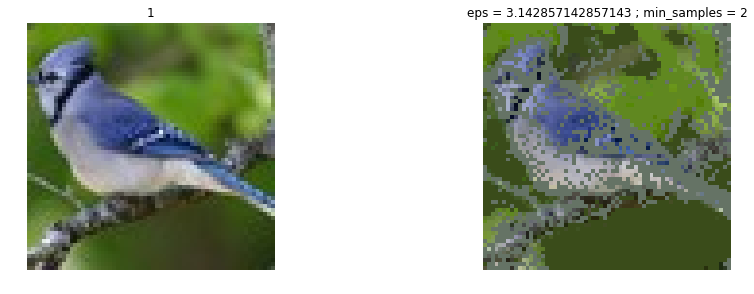

SSIM(original image, eps = 3.142857142857143 ; min_samples = 2) = 0.5766578802417953


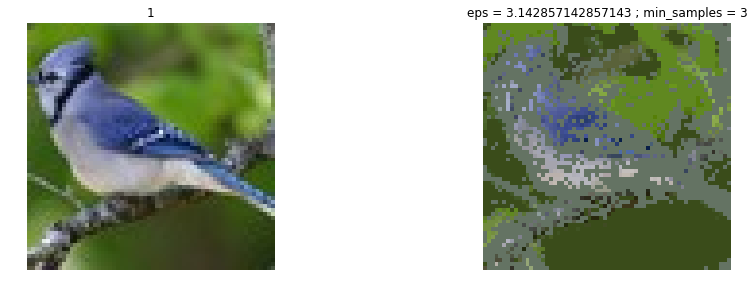

SSIM(original image, eps = 3.142857142857143 ; min_samples = 3) = 0.4673991110504557


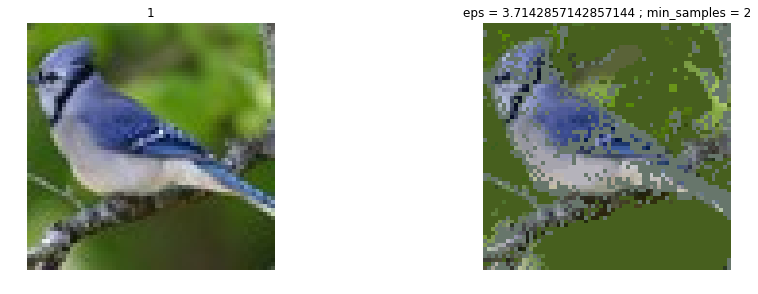

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 2) = 0.6026476210063706


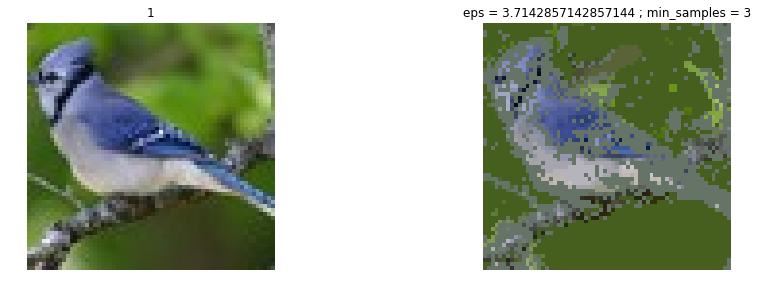

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 3) = 0.5095435030186697


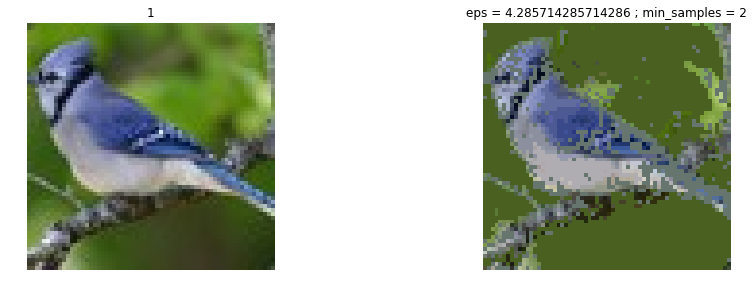

SSIM(original image, eps = 4.285714285714286 ; min_samples = 2) = 0.6522052957931801


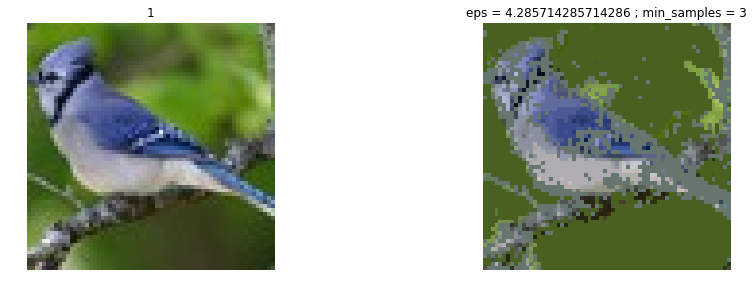

SSIM(original image, eps = 4.285714285714286 ; min_samples = 3) = 0.5828452314574962


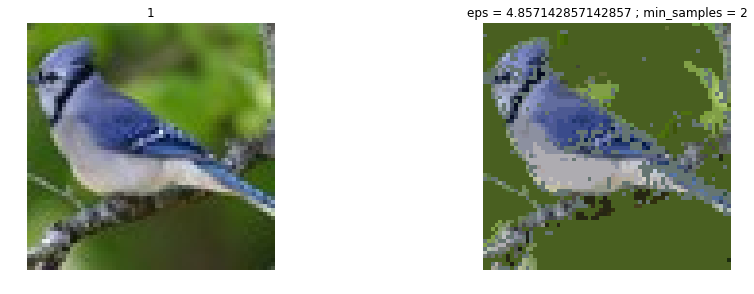

SSIM(original image, eps = 4.857142857142857 ; min_samples = 2) = 0.6752259838568778


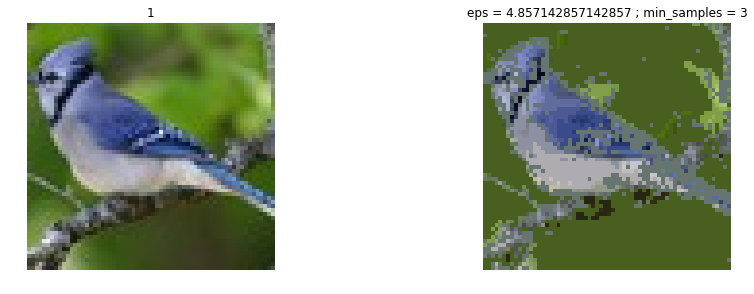

SSIM(original image, eps = 4.857142857142857 ; min_samples = 3) = 0.6192677954744453


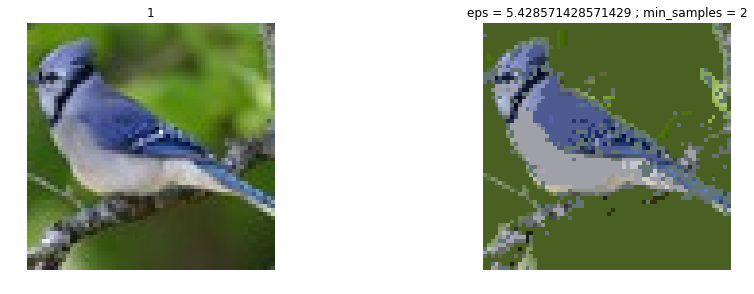

SSIM(original image, eps = 5.428571428571429 ; min_samples = 2) = 0.6418593694823619


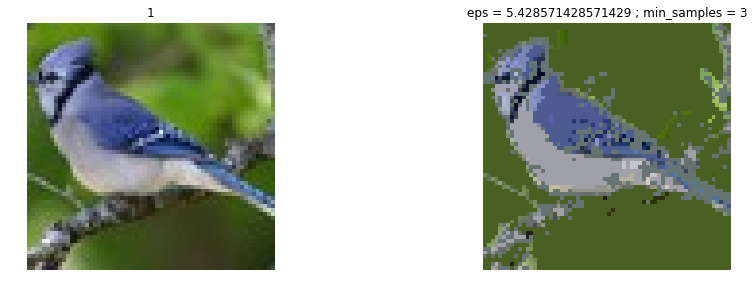

SSIM(original image, eps = 5.428571428571429 ; min_samples = 3) = 0.6003675014519989


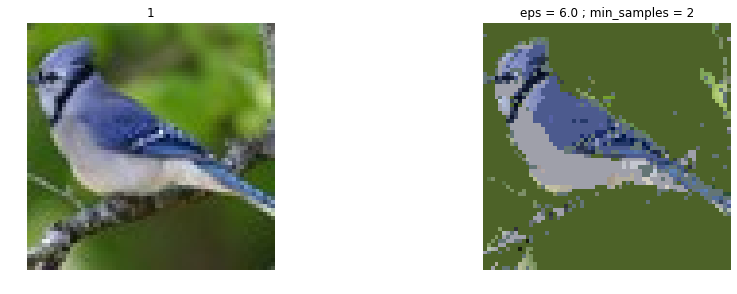

SSIM(original image, eps = 6.0 ; min_samples = 2) = 0.5909892803049207


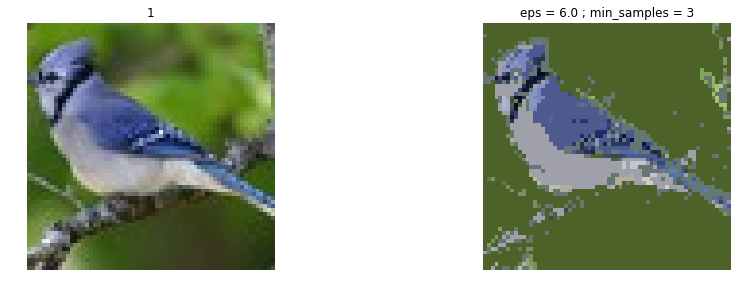

SSIM(original image, eps = 6.0 ; min_samples = 3) = 0.5619472686532238


In [66]:

small_bird_img = cv2.imread('small_bird.jpg')
epss_size_data = np.linspace(2.0, 6.0, 8)
min_samples_size_data = np.array([2, 3, 4, 5, 6])

#draw_picture(create_new_image(img, DBSCAN(eps=2.0, min_samples=3)))

for i in range(len(epss_size_data)) :
    for j in range(len(min_samples_size_data)) :
        eps = epss_size_data[i]
        min_samples = min_samples_size_data[j]
        new_img = create_new_image(small_bird_img, DBSCAN(eps=eps, min_samples=min_samples))
        show_ssim(small_bird_img, new_img, 'eps = {} ; min_samples = {}'.format(eps, min_samples))
    
    
    


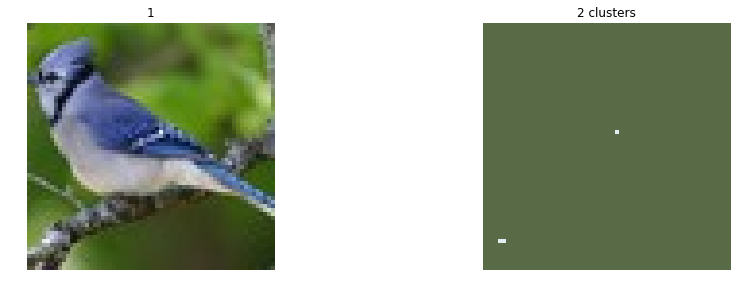

SSIM(original image, 2 clusters) = 0.22567598426934307


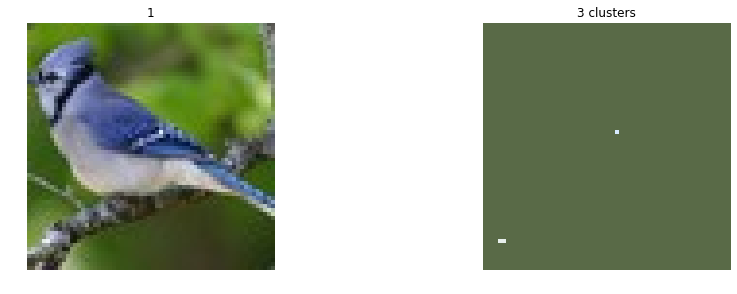

SSIM(original image, 3 clusters) = 0.22562800974055194


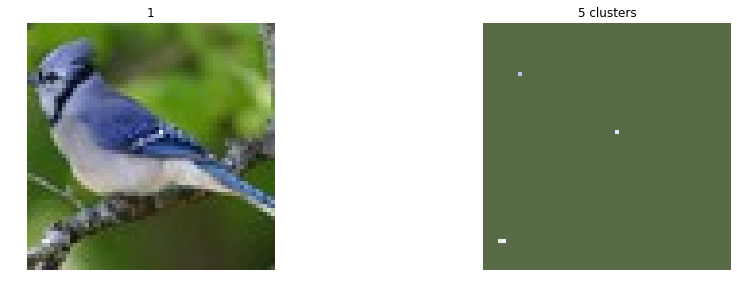

SSIM(original image, 5 clusters) = 0.22764893991642285


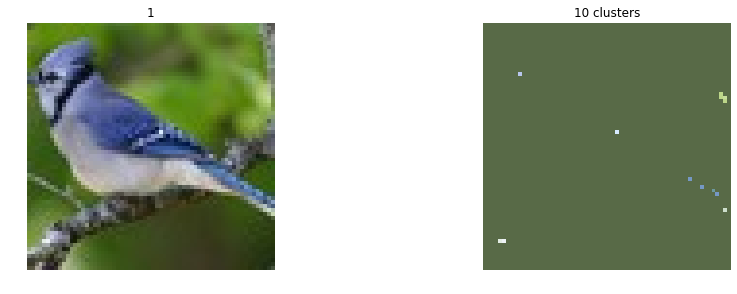

SSIM(original image, 10 clusters) = 0.23518148748197296


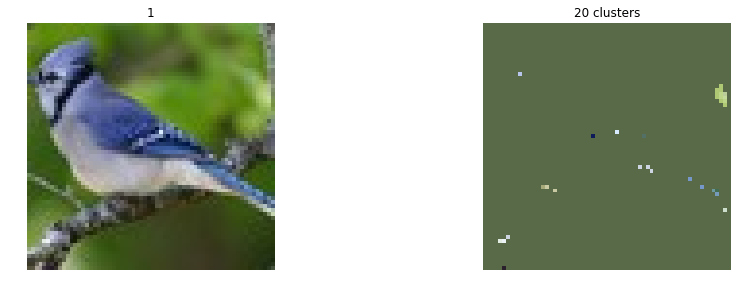

SSIM(original image, 20 clusters) = 0.2487872573300517


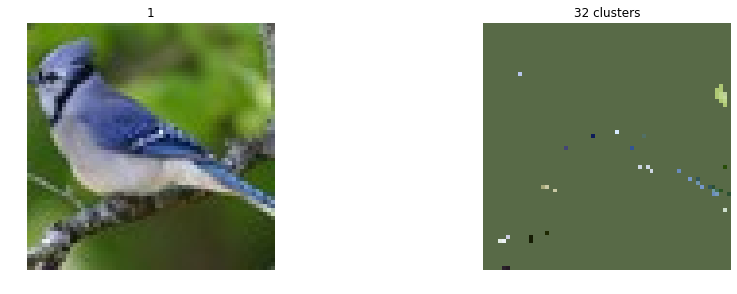

SSIM(original image, 32 clusters) = 0.25695638283004874


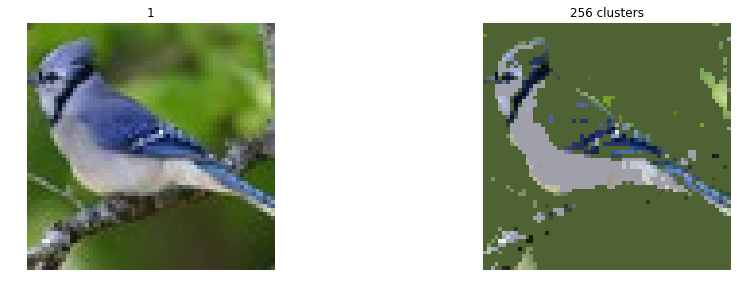

SSIM(original image, 256 clusters) = 0.5962771347854466


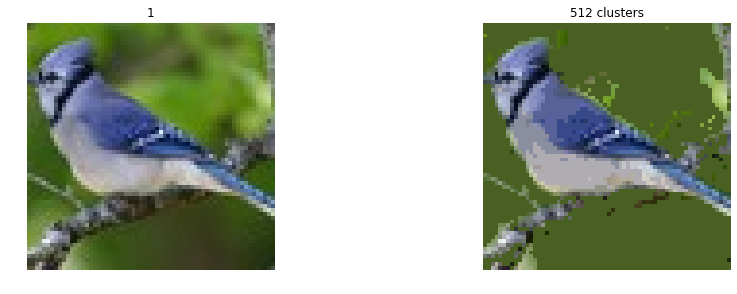

SSIM(original image, 512 clusters) = 0.7509355965555925


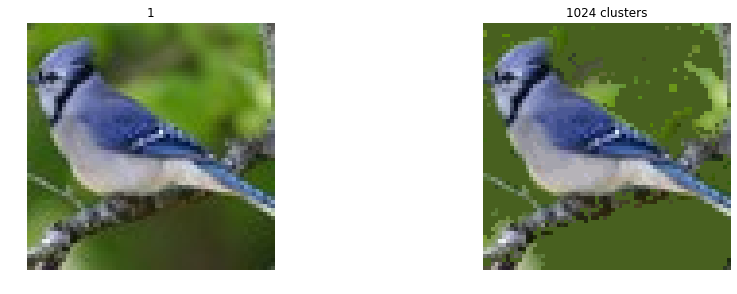

SSIM(original image, 1024 clusters) = 0.8259016443571583


In [167]:

# на попугайчиках оно подохло

AC_size_data = np.array([2, 3, 5, 10, 20, 32, 256, 512, 1024])

for i in range(len(AC_size_data)) :
    new_img = create_new_image(small_bird_img, AgglomerativeClustering(n_clusters=AC_size_data[i], linkage='single'))
    show_ssim(small_bird_img, new_img, str(AC_size_data[i]) + ' clusters')


# 2 - Уменьшение размерности помогает классификации лиц (суммарно 6 баллов)

Используя методы уменьшения размерности признаков, решите с максимальным **accuracy** задачу классификации лиц знаменитостей (датасет старый, неудивительно, если вы из всех знаменитостей будете знать только Буша и Шварценнегера).

Попробуйте добиться максимального accuracy (2 балла)
* без уменьшения размерности
* с уменьшением размерности

Возможно без уменьшения размерности у вас даже просто не получится дождаться времени работы на 11750 признаках. Я слышал у кого-то получилось, у меня нет.

Сравните ваш результат с константным предсказанием "всегда самый популярный класс". Делает ли ваша модель какой-то значительный прогресс? (1 балл)

Нарисуйте несколько лиц, на которых ваш алгоритм ошибся, подпишите правильный ответ и ваш ответ. (1 балл)

Напишите, каким алгоритмом вы воспользовались (PCA или TSNE), почему не другим? Обоснуйте ответ. (1 балл)

Визуализируйте датасет на плоскости. Подпишите несколько самых больших классов именами людей. Чем вы воспользуетесь, PCA или TSNE? Обоснуйте ответ (1 балл)

Скачивание данных и вспомогательная функция визуализации лиц уже есть:

In [70]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.datasets import fetch_lfw_people
lfw_people = fetch_lfw_people(min_faces_per_person=30, resize=1.0)
# эту строчку менять нельзя, ресайзить нельзя

URLError: <urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed (_ssl.c:777)>

In [10]:
from sklearn.model_selection import train_test_split
X = lfw_people.data
y = lfw_people.target
names = lfw_people.target_names

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, random_state=42)
# эту строчку тоже менять нельзя'

In [12]:
X.shape # 2370 лиц, каждый из них представляется вектором размера 11750

(2370, 11750)

In [13]:
y.shape

(2370,)

In [17]:
names[8] # в y лежат номера, а names переводит номер в имя

'George W Bush'

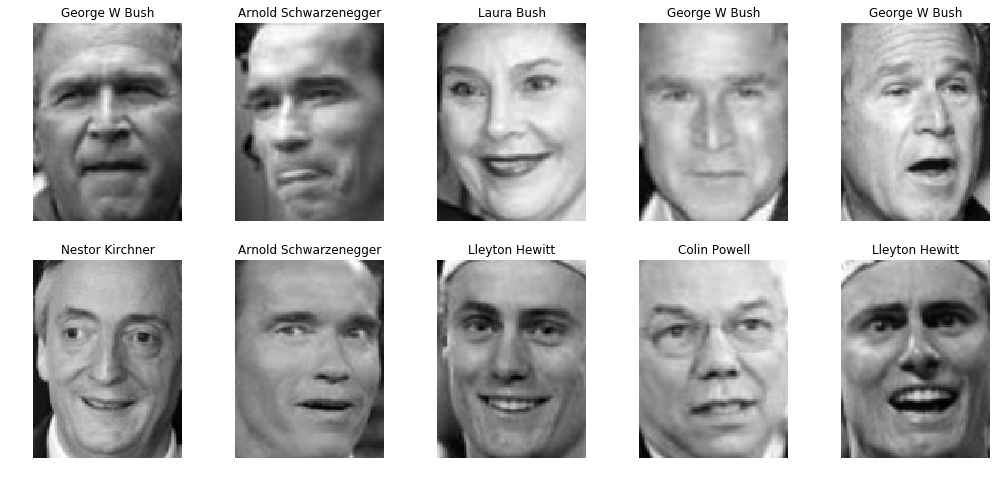

In [15]:
import matplotlib.pyplot as plt
def plot_image(image_id):
    # функция рисует изображение номер image_id
    plt.title(names[y[image_id]])
    plt.imshow(255 - lfw_people['images'][image_id], cmap=plt.cm.gray_r, interpolation='nearest')
    
def plot_grid(image_ids, nrows, ncols):
    # функция рисует изображения с id равными image_ids
    # в nrows рядов и ncols столбцов
    fig = plt.gcf()
    fig.set_size_inches(17.5, 8)
    for index, example_id in enumerate(image_ids):
        plt.subplot(nrows, ncols, index + 1)
        plot_image(example_id)
        plt.axis('off')

plot_grid(range(10), nrows=2, ncols=5)# первые 10 лиц